## This notebook series is based on "Machine Learning Mastery With Python" by Jason Brownlee
### Installing the required packages

In [12]:
!pip install scipy
!pip install matplotlib
!pip install pandas
!pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 283 kB 280 kB/s 


Importing the required packages

In [16]:
import pandas  as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
from pandas.plotting import scatter_matrix

### Load Datasets from CSV.

In [3]:
filename = 'data/pima-indians-diabetes.csv'
names = ['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age', 'class']
data = pd.read_csv(filename, names=names)
print(data.shape)

(768, 9)


In [4]:
data.head()

,preg,plas,pres,skin,test,mass,pedi,age,class
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
#understanding the data types
types = data.dtypes
print(types)

preg       int64
plas       int64
pres       int64
skin       int64
test       int64
mass     float64
pedi     float64
age        int64
class      int64
dtype: object


## Understanding the Data with Descrptive Statistics
### Descriptive Statistics

In [8]:
pd.set_option('display.width', 100) #to increase the default display size to get the all the columms printed in one row
pd.set_option('precision', 3) #to decrase the default precision value.
description = data.describe()
print(description)

          preg     plas     pres     skin     test     mass     pedi      age    class
count  768.000  768.000  768.000  768.000  768.000  768.000  768.000  768.000  768.000
mean     3.845  120.895   69.105   20.536   79.799   31.993    0.472   33.241    0.349
std      3.370   31.973   19.356   15.952  115.244    7.884    0.331   11.760    0.477
min      0.000    0.000    0.000    0.000    0.000    0.000    0.078   21.000    0.000
25%      1.000   99.000   62.000    0.000    0.000   27.300    0.244   24.000    0.000
50%      3.000  117.000   72.000   23.000   30.500   32.000    0.372   29.000    0.000
75%      6.000  140.250   80.000   32.000  127.250   36.600    0.626   41.000    1.000
max     17.000  199.000  122.000   99.000  846.000   67.100    2.420   81.000    1.000


### Class Distribution (classification only)
To see if we got a balanced dataset

In [9]:
data['class'].value_counts()

0    500
1    268
Name: class, dtype: int64

### Correlations Between Attributes

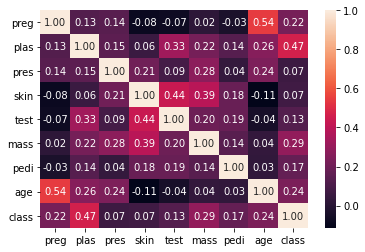

In [14]:
    fig=plt.figure()
    sns.heatmap(data.corr(),annot=True, fmt='.2f')
    plt.show()

### Skew of Univariate Distributions
Many machine learning algorithms assume a Gaussian distribution. Knowing that an attribute has a skew may allow you to perform data preparation to correct the skew and later improve the accuracy of your models.

In [15]:
skew = data.skew()
print(skew)

preg     0.902
plas     0.174
pres    -1.844
skin     0.109
test     2.272
mass    -0.429
pedi     1.920
age      1.130
class    0.635
dtype: float64


##  Understanding the Data With Visualization
### Univariate Plots
#### Histograms

array([[<AxesSubplot:title={'center':'preg'}>,
        <AxesSubplot:title={'center':'plas'}>,
        <AxesSubplot:title={'center':'pres'}>],
       [<AxesSubplot:title={'center':'skin'}>,
        <AxesSubplot:title={'center':'test'}>,
        <AxesSubplot:title={'center':'mass'}>],
       [<AxesSubplot:title={'center':'pedi'}>,
        <AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'class'}>]], dtype=object)

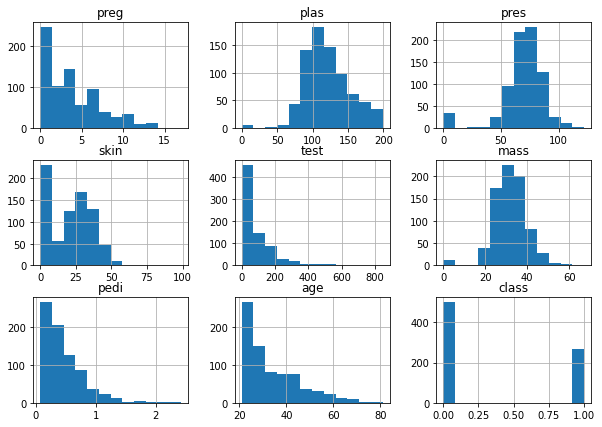

In [23]:
data.hist(bins=12,figsize=(10,7))

#### Density plots

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>]], dtype=object)

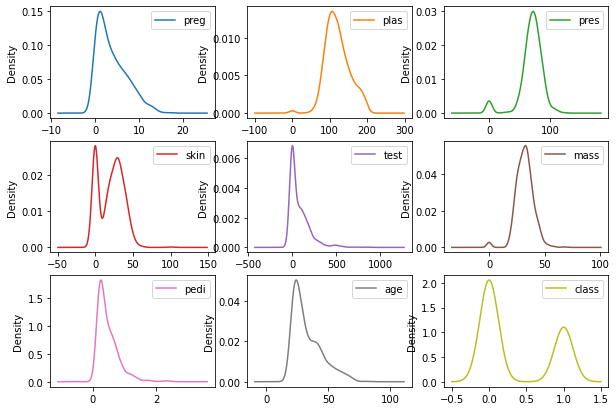

In [12]:
data.plot(kind='density', subplots=True, layout=(3,3), sharex=False,figsize=(10,7))

#### Box and Whisker Plots

preg        AxesSubplot(0.125,0.657941;0.227941x0.222059)
plas     AxesSubplot(0.398529,0.657941;0.227941x0.222059)
pres     AxesSubplot(0.672059,0.657941;0.227941x0.222059)
skin        AxesSubplot(0.125,0.391471;0.227941x0.222059)
test     AxesSubplot(0.398529,0.391471;0.227941x0.222059)
mass     AxesSubplot(0.672059,0.391471;0.227941x0.222059)
pedi           AxesSubplot(0.125,0.125;0.227941x0.222059)
age         AxesSubplot(0.398529,0.125;0.227941x0.222059)
class       AxesSubplot(0.672059,0.125;0.227941x0.222059)
dtype: object

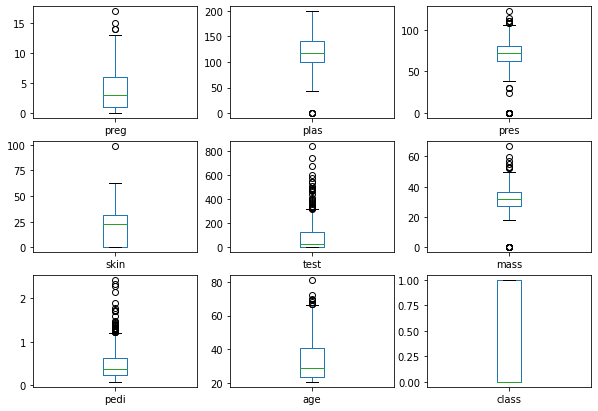

In [13]:
data.plot(kind='box', subplots=True, layout=(3,3), sharex=False, sharey=False,figsize=(10,7))

### Muultivariate Plots
#### Scatter Plot

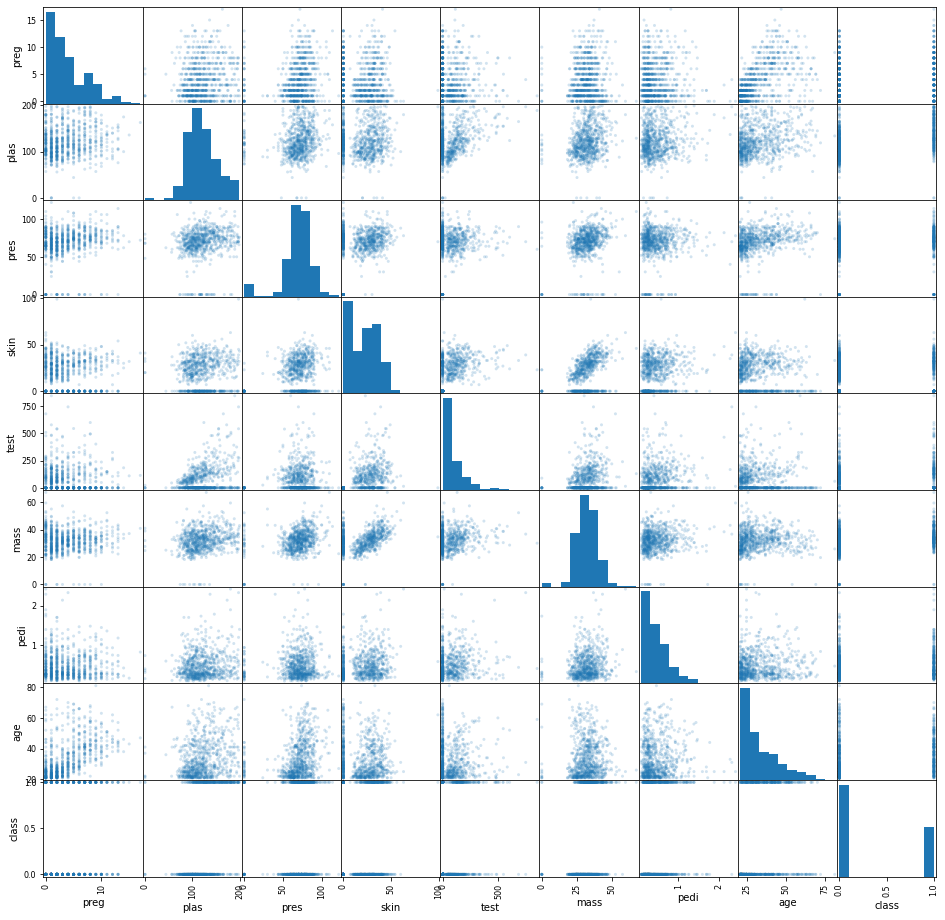

In [18]:
scatter_matrix(data, alpha=0.2, figsize=(16, 16));